### 数分小妹也可以上线规则的强大可视化工具

1. 用hiplot数据分析，可视化选定正负样本。
2. 只能在jupyter notebook运行，不能是jupyter lab
3. 每次选定以后不要exclude，也不要keep，直接运行 `display.get_brush_extents()`
4. 运行一条编写一次规则

In [1]:
import polars as pl

df = pl.read_csv(
    "./data/creditcard.csv", ignore_errors=True
).drop(["Time", "Amount"])

In [2]:
df.group_by("Class").count()

Class,count
i64,u32
0,284315
1,492


In [3]:
df_ml = pl.concat([
    df.filter(pl.col("Class") == 1),
    df.filter(pl.col("Class") == 0).sample(5000)
    ]
)

df_ml.head()

V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Class
f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,i64
-2.312227,1.951992,-1.609851,3.997906,-0.522188,-1.426545,-2.537387,1.391657,-2.770089,-2.772272,3.202033,-2.899907,-0.595222,-4.289254,0.389724,-1.140747,-2.830056,-0.016822,0.416956,0.126911,0.517232,-0.035049,-0.465211,0.320198,0.044519,0.17784,0.261145,-0.143276,1
-3.043541,-3.157307,1.088463,2.288644,1.359805,-1.064823,0.325574,-0.067794,-0.270953,-0.838587,-0.414575,-0.503141,0.676502,-1.692029,2.000635,0.66678,0.599717,1.725321,0.283345,2.102339,0.661696,0.435477,1.375966,-0.293803,0.279798,-0.145362,-0.252773,0.035764,1
-2.30335,1.759247,-0.359745,2.330243,-0.821628,-0.075788,0.56232,-0.399147,-0.238253,-1.525412,2.032912,-6.560124,0.022937,-1.470102,-0.698826,-2.282194,-4.781831,-2.615665,-1.334441,-0.430022,-0.294166,-0.932391,0.172726,-0.08733,-0.156114,-0.542628,0.039566,-0.153029,1
-4.397974,1.358367,-2.592844,2.679787,-1.128131,-1.706536,-3.496197,-0.248778,-0.247768,-4.801637,4.895844,-10.912819,0.184372,-6.771097,-0.007326,-7.358083,-12.598419,-5.131549,0.308334,-0.171608,0.573574,0.176968,-0.436207,-0.053502,0.252405,-0.657488,-0.827136,0.849573,1
1.234235,3.01974,-4.304597,4.732795,3.624201,-1.357746,1.713445,-0.496358,-1.282858,-2.447469,2.101344,-4.609628,1.464378,-6.079337,-0.339237,2.581851,6.739384,3.042493,-2.721853,0.009061,-0.379068,-0.704181,-0.656805,-1.632653,1.488901,0.566797,-0.010016,0.146793,1


In [4]:
import hiplot as hip

display = hip.Experiment.from_iterable(df_ml.to_dicts()).display()

<IPython.core.display.Javascript object>

In [5]:
display.get_brush_extents()

{'V14': {'type': 'numeric',
  'brush_extents_normalized': [-0.0015441296147365197, 0.5631617527382047],
  'range': [-19.25201400511207, -5.468892542894116],
  'include_infnans': False}}

**选择变量V4**

In [8]:
display.get_brush_extents()

{'V4': {'type': 'numeric',
  'brush_extents_normalized': [0.9909865136240043, 0.6733394548004749],
  'range': [11.96097328129508, 6.544434789694783],
  'include_infnans': False}}

**选择变量V14**

In [14]:
display.get_brush_extents()

{'V14': {'type': 'numeric',
  'brush_extents_normalized': [-6.163354013480392e-06, 0.6039154052734375],
  'range': [-19.214478987899298, -4.173880304283034],
  'include_infnans': False}}

**选择变量V1**

In [37]:
display.get_brush_extents()

{'V10': {'type': 'numeric',
  'brush_extents_normalized': [0.0027328192018995097, 0.5537132113587623],
  'range': [-24.483779320313847, -3.4182991371163665],
  'include_infnans': False}}

**只要Precision不管Recall的强规则**

In [36]:
label_count = df_ml.filter(pl.col("Class")==1).shape[0]
print("Total {} positive samples".format(label_count))

Total 492 positive samples


In [31]:
def display_metric(df, rule):
    
    precision = df.filter(
        rule
    )['Class'].mean()
    
    samples = df.filter(
        rule
    ).shape[0]
    
    print(f"Precision is {precision}, number of samples: {samples}")

**这三就够组成一个不错的规则了，别的不说，Prevision是真的高**

In [34]:
display_metric(df_ml, pl.col("V14" )< -4.17388)

Precision is 0.9739583333333334, number of samples: 384


In [35]:
display_metric(df_ml, pl.col("V4" )> 6.544)

Precision is 0.9908256880733946, number of samples: 109


In [38]:
display_metric(df_ml, pl.col("V10" ) < -3.418)

Precision is 0.9876160990712074, number of samples: 323


### 数据集

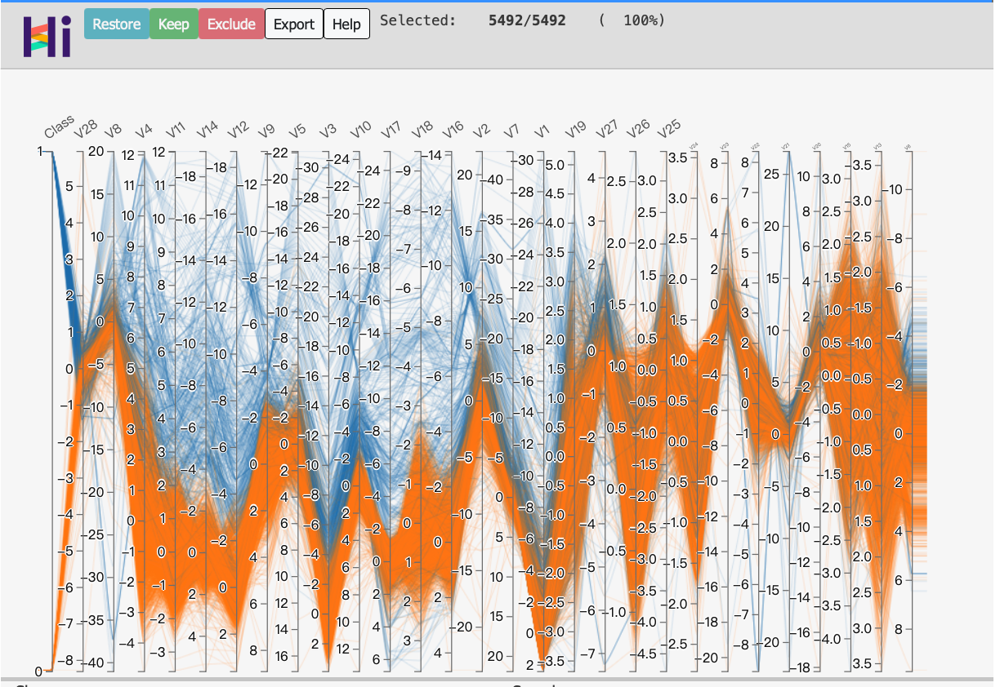

### 规则结果

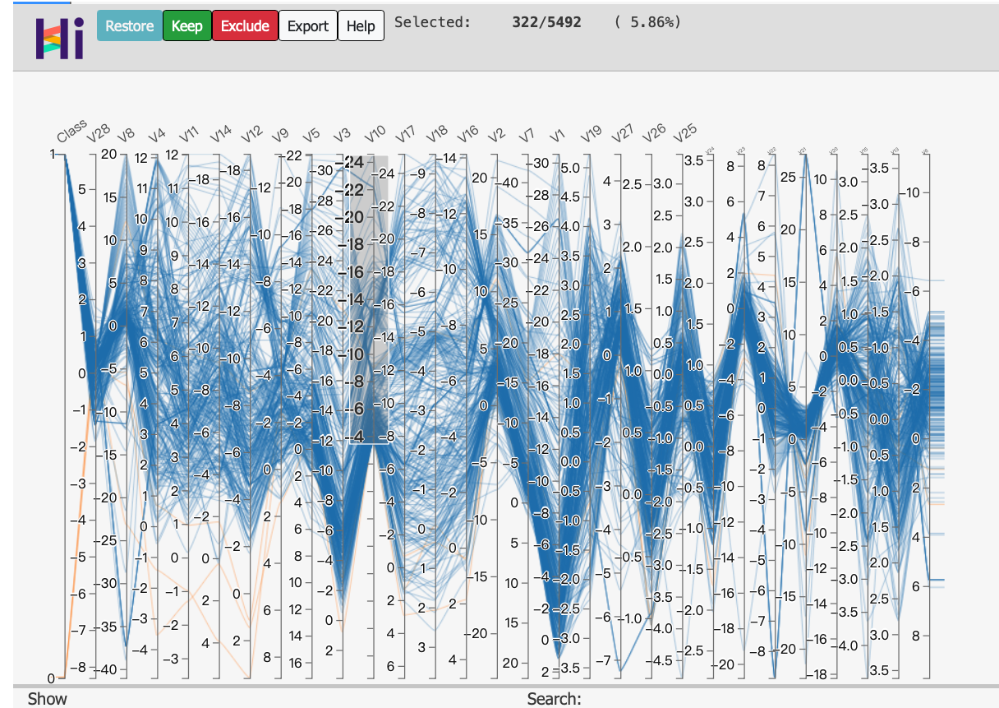